In [1]:
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow_io as tfio

In [2]:
import tensorflow as tf

In [3]:
from IPython import display

In [4]:
import random
random.seed(42)

In [5]:
ebirds = ['norcar', 'blujay', 'bkcchi']

In [6]:
files = glob('dataset/'+ebirds[0]+'/*')

In [12]:
file_shape, decoded_audio = [], []
for file in files:
    audio = tf.io.read_file(file)
    decoded_audio.append(tfio.audio.decode_mp3(audio))
    
    file_shape.append(decoded_audio[-1].shape)

### Some are mono-channel, some are stereo

In [13]:
num_channels = np.array([file_shape[i][1] for i in range(len(file_shape))])

In [14]:
np.unique(num_channels, return_counts=True)

(array([1, 2]), array([57, 43]))

### Differences in file length is pretty large

In [15]:
file_lengths = np.array([file_shape[i][0] for i in range(len(file_shape))])

In [16]:
file_lengths.max() / file_lengths.min()

148.24831712789828

In [91]:
file_lengths.argmax()

97

(array([64., 26.,  4.,  1.,  2.,  0.,  1.,  1.,  0.,  1.]),
 array([  168462. ,  2649036.6,  5129611.2,  7610185.8, 10090760.4,
        12571335. , 15051909.6, 17532484.2, 20013058.8, 22493633.4,
        24974208. ]),
 <BarContainer object of 10 artists>)

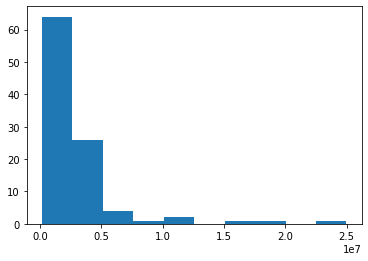

In [17]:
plt.hist(np.array(file_lengths))

In [92]:
shortest_file_idx = file_lengths.argmin()
longest_file_idx = file_lengths.argmax()

In [93]:
display.Audio(files[longest_file_idx])

In [20]:
decoded_audio_stats = {'max':[], 'min':[], 'mean':[], 'std':[], 'len':[], 'channels':[]}

for sample in decoded_audio:
    decoded_audio_stats['max'].append(sample.numpy().max())
    decoded_audio_stats['min'].append(sample.numpy().min())
    decoded_audio_stats['mean'].append(sample.numpy().mean())
    decoded_audio_stats['std'].append(sample.numpy().std())
    decoded_audio_stats['len'].append(sample.shape[0])
    decoded_audio_stats['channels'].append(sample.shape[1])

In [21]:
decoded_audio_stats['range'] = []
for sample in decoded_audio:
    decoded_audio_stats['range'].append(sample.numpy().max() - sample.numpy().min())

### will need to minmaxscale the input. There're implications. What if some birds are just quieter?

(array([18., 13., 13., 16., 12., 12.,  7.,  3.,  4.,  2.]),
 array([0.0691722 , 0.33101803, 0.5928639 , 0.85470974, 1.1165556 ,
        1.3784014 , 1.6402472 , 1.9020932 , 2.163939  , 2.4257848 ,
        2.6876307 ], dtype=float32),
 <BarContainer object of 10 artists>)

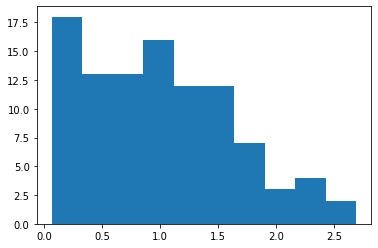

In [22]:
plt.hist(decoded_audio_stats['range'])

### periods of silence. Maybe can split by the silent gaps?

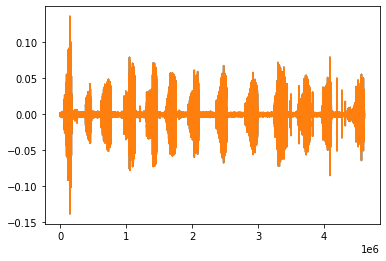

In [81]:
sample = random.choice(decoded_audio)
plt.plot(sample)

### slight differences in the two channels. Maybe it's best to use only one channel. Sometimes the other channel has no signal

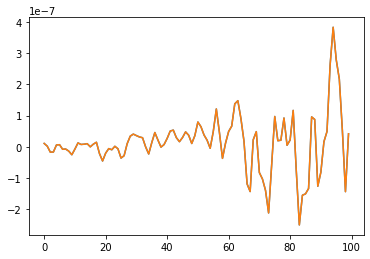

In [82]:
plt.plot(sample[1250:1350])

### make a prediction for a minimum window size? And take a majority vote if the recording is longer?

### spectrogram

In [83]:
sample_range = sample[:,0].numpy().max() - sample[:,0].numpy().min()
sample = sample[:,0]/(sample_range)
sample_range = sample.numpy().max() - sample.numpy().min()
sample_range

1.0

In [85]:
sample_spectrogram = tfio.experimental.audio.spectrogram(sample, nfft=512, window=512, stride=256, name='spectrogram')

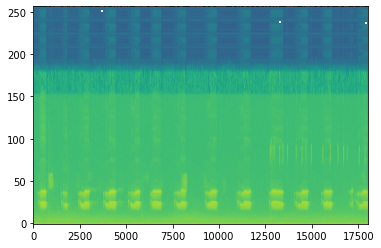

In [87]:
plt.figure()
data = tf.math.log(tf.transpose(sample_spectrogram)).numpy()
plt.imshow(data, aspect='auto', origin='lower')

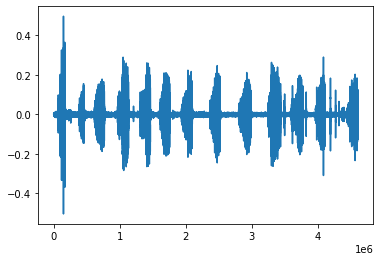

In [88]:
plt.plot(sample)